# Inference Kernel Demo

This notebook uses Blazeface implemented [here](https://github.com/hollance/BlazeFace-PyTorch) and tests and run predictions on deepfake data.

In [1]:
import os, sys, time
import cv2
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from PIL import Image

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as patches

## Get the test videos

In [2]:
test_dir = "./data/test_videos"

test_videos = sorted([x for x in os.listdir(test_dir) if x[-4:] == ".mp4"])
len(test_videos)

400

## Create helpers

In [3]:
print("PyTorch version:", torch.__version__)
print("CUDA version:", torch.version.cuda)
print("cuDNN version:", torch.backends.cudnn.version())

PyTorch version: 1.4.0
CUDA version: 10.1
cuDNN version: 7603


In [4]:
gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
gpu

device(type='cuda', index=0)

In [38]:
from facenet_pytorch import MTCNN

mtcnn = MTCNN(margin=20, keep_all=True, post_process=False, device='cuda:0')
face_detector = mtcnn
_ = face_detector.train(False)

In [62]:
from blazeface import BlazeFace
face_detector = BlazeFace().to(gpu)
face_detector.load_weights("./blazeface.pth")
face_detector.load_anchors("./anchors.npy")
_ = face_detector.train(False)

In [63]:
class VideoReader():
    def __init__(self, frames_per_video=24):
        self.frames_per_video = frames_per_video
        
    def read_frames(self, video_path):
        frames = []
        capture = cv2.VideoCapture(video_path)

        success = 1
        count = 0

        while success: 

            success, frame = capture.read() 
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = cv2.resize(frame, (128, 128))

            frames.append(frame)

            count += 1
            
            if count >= self.frames_per_video:
                return frames            
        capture.release()
        return frames

In [64]:
# from helpers.read_video_1 import VideoReader
# from helpers.face_extract_1 import FaceExtractor

frames_per_video = 17

video_reader = VideoReader(frames_per_video=frames_per_video)
video_read_fn = lambda x: video_reader.read_frames(x)

In [65]:
## quick test
video_path = os.path.join('./data/test_videos', test_videos[1])

In [66]:
len(video_read_fn(video_path))

17

In [67]:
class FaceExtractor():
    def __init__(self, video_read_fn, face_detector):
        self.video_read_fn = video_read_fn
        self.face_detector = face_detector
        
    def keep_only_best_face(self, faces):
        if len(faces) == 0:
            ## Skip this frame
            return False
        faces = torch.max(torch.stack(faces, dim=0), axis=1).values
        for face in faces:
            face = face[:4]
        return faces
        
    def process_video(self, video_path):
        frames = self.video_read_fn(video_path)
        faces = []
        for frame in frames:
            faces.append(self.face_detector.predict_on_image(frame))
            
        return faces, frames

In [68]:
face_extractor = FaceExtractor(video_read_fn, face_detector)

In [69]:
input_size = 224

In [70]:
from torchvision.transforms import Normalize

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
normalize_transform = Normalize(mean, std)

In [71]:
def isotropically_resize_image(img, size, resample=cv2.INTER_AREA):
    h, w = img.shape[:2]
    if w > h:
        h = h * size // w
        w = size
    else:
        w = w * size // h
        h = size

    resized = cv2.resize(img, (w, h), interpolation=resample)
    return resized


def make_square_image(img):
    h, w = img.shape[:2]
    size = max(h, w)
    t = 0
    b = size - h
    l = 0
    r = size - w
    return cv2.copyMakeBorder(img, t, b, l, r, cv2.BORDER_CONSTANT, value=0)

In [72]:
import torch.nn as nn
import torchvision.models as models

class MyResNeXt(models.resnet.ResNet):
    def __init__(self, training=True):
        super(MyResNeXt, self).__init__(block=models.resnet.Bottleneck,
                                        layers=[3, 4, 6, 3], 
                                        groups=32, 
                                        width_per_group=4)
        self.fc = nn.Linear(2048, 1)
        
def add_fc_layer(model):
    model.fc = nn.Linear(2048, 1)
    return model

In [73]:
# Pick model
# model_name = 'resnext50_32x4d'
model_name = 'wider-resnext101'
# model_name = 'resnext50_32x4d'
# model_name = 'efficientnet-b7'

In [74]:
## Load efficient net
!pip install -q efficientnet_pytorch

In [75]:
from efficientnet_pytorch import EfficientNet

In [76]:
## load efficientnet
from efficientnet_pytorch import EfficientNet
model = EfficientNet.from_pretrained('efficientnet-b7') 

## Transfer learn
num_features = model._fc.in_features

model._fc = nn.Linear(num_features, 1) ## Binary classifier

model = nn.DataParallel(model).to(gpu)

model.load_state_dict(torch.load('a-train-efficientnet-b7-deep-image-classifier-checkpoint.pth', map_location=gpu))

_ = model.eval()
_ = model.train(False)

Loaded pretrained weights for efficientnet-b7


In [77]:
model = None

if model_name == 'resnext50_32x4d':
    model = MyResNeXt().to(gpu)
    trained_path = 'image-classifier-checkpoint.pth'    
elif model_name == 'wider-resnext101':
    model = models.wide_resnet101_2(pretrained=True)
    trained_path = 'wider-resnext101-image-classifier-checkpoint-lr-0.01-epochs-8.pth'
elif model_name == 'resnext101':
    model = models.resnext101_32x8d(pretrained=False)
    trained_path = 'resnext101-image-classifier-checkpoint-lr-0.01-epochs-8.pth'
elif model_name == 'efficientnet-b7':
    model = EfficientNet.from_pretrained(model_name)
    trained_path = 'efficientnet-image-classifier-checkpoint.pth'
else:
    raise NotImplementedError
    
model = add_fc_layer(model)
model = model.to(gpu)

model.load_state_dict(torch.load(trained_path))
_ = model.eval()
# del checkpoint

Test Runs

In [78]:
def crop_face(img, detections):    
    if isinstance(detections, torch.Tensor):
        detections = detections.cpu().numpy()

    if detections.ndim == 1:
        detections = np.expand_dims(detections, axis=0)

#     print("Found %d faces" % detections.shape[0])
        
    for i in range(detections.shape[0]):
        ymin = detections[i, 0] * img.shape[0]
        xmin = detections[i, 1] * img.shape[1]
        ymax = detections[i, 2] * img.shape[0]
        xmax = detections[i, 3] * img.shape[1]

        frame = Image.fromarray(img)
        return frame.crop((xmin, ymin, xmax, ymax))

In [79]:
def plot_detections(img, detections, with_keypoints=True):
    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.grid(False)
    ax.imshow(img)
    
    if isinstance(detections, torch.Tensor):
        detections = detections.cpu().numpy()

    if detections.ndim == 1:
        detections = np.expand_dims(detections, axis=0)

    print("Found %d faces" % detections.shape[0])
        
    for i in range(detections.shape[0]):
        ymin = detections[i, 0] * img.shape[0]
        xmin = detections[i, 1] * img.shape[1]
        ymax = detections[i, 2] * img.shape[0]
        xmax = detections[i, 3] * img.shape[1]

        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=1, edgecolor="r", facecolor="none", 
                                 alpha=detections[i, 16])
        ax.add_patch(rect)

        if with_keypoints:
            for k in range(6):
                kp_x = detections[i, 4 + k*2    ] * img.shape[1]
                kp_y = detections[i, 4 + k*2 + 1] * img.shape[0]
                circle = patches.Circle((kp_x, kp_y), radius=0.5, linewidth=1, 
                                        edgecolor="lightskyblue", facecolor="none", 
                                        alpha=detections[i, 16])
                ax.add_patch(circle)
        
    plt.show()

In [80]:
video_path = os.path.join('./data/test_videos', test_videos[2])

In [81]:
def read_frame(video_path, resize=True):
    capture = cv2.VideoCapture(video_path)
    ret, frame = capture.read()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    if resize:
        frame = cv2.resize(frame, (128, 128))
    capture.release()
    return frame

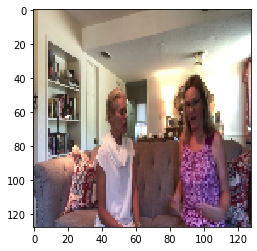

In [82]:
frame = read_frame(video_path)
plt.imshow(frame)

In [86]:
%time detections = face_detector.predict_on_image(frame)

CPU times: user 19.2 ms, sys: 3.51 ms, total: 22.7 ms
Wall time: 11.5 ms


In [87]:
detections.shape

torch.Size([1, 17])

Found 1 faces


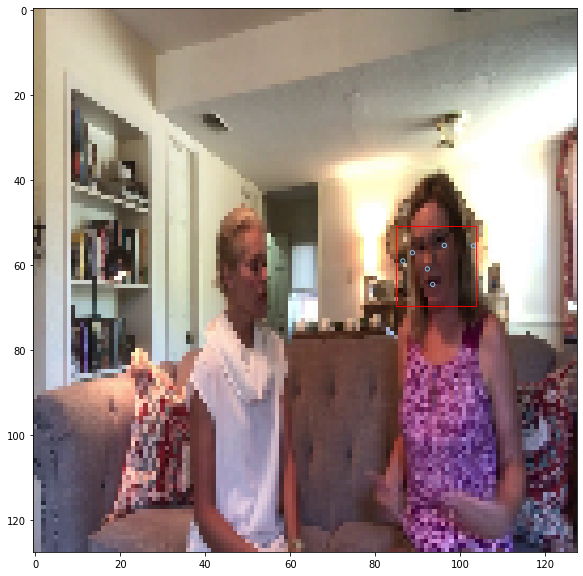

In [88]:
plot_detections(frame, detections)

In [89]:
detections, frames = face_extractor.process_video(video_path)

Found 1 faces


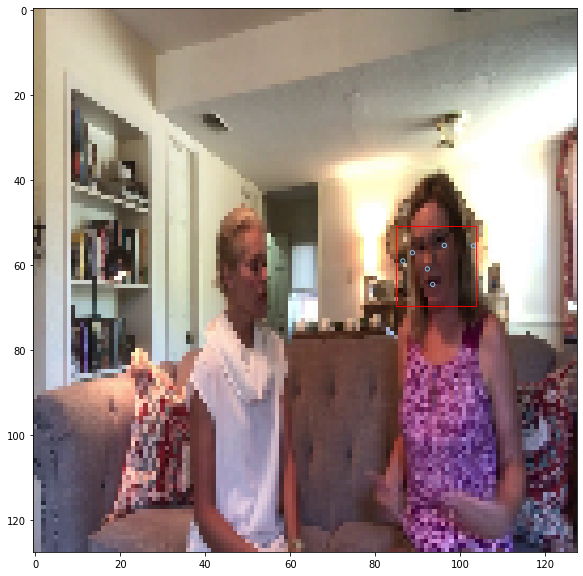

Found 1 faces


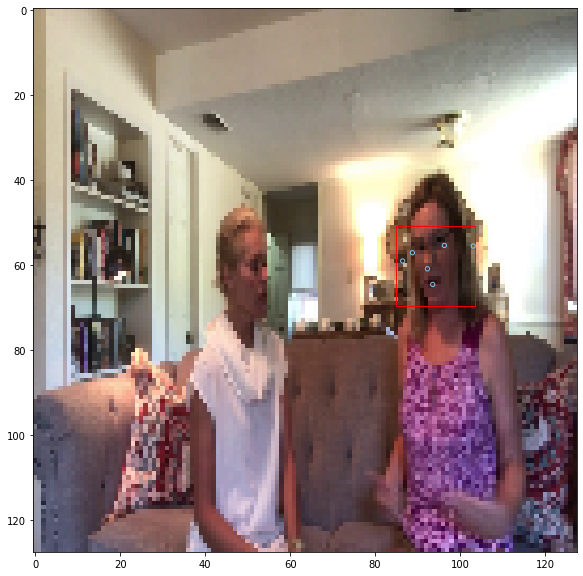

Found 1 faces


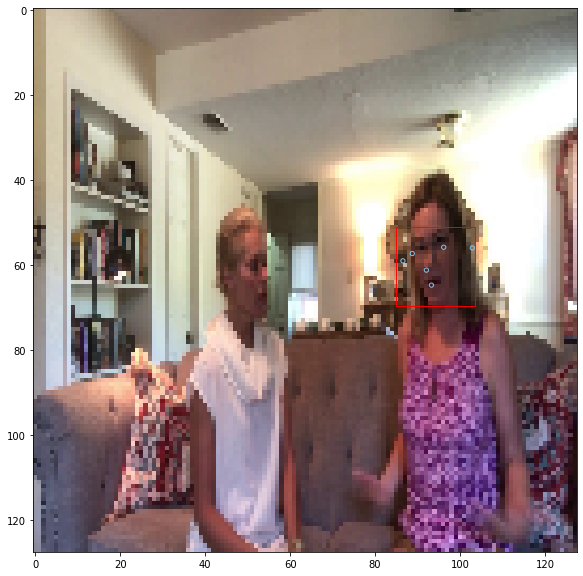

Found 1 faces


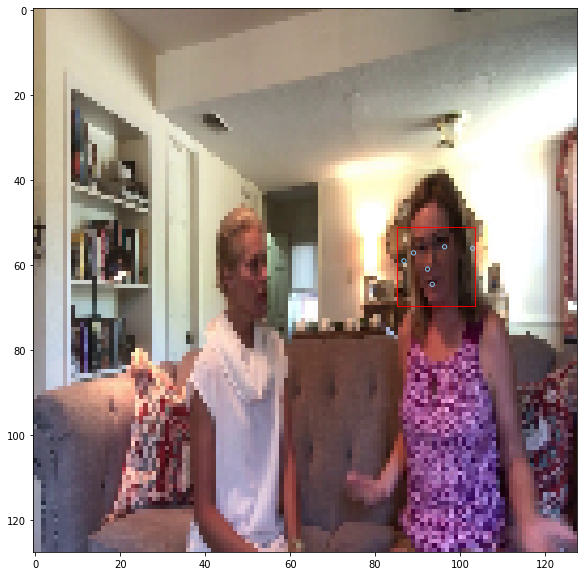

Found 1 faces


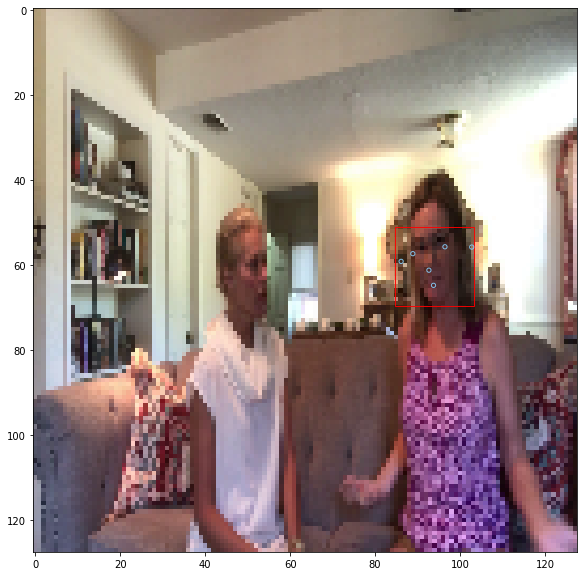

In [90]:
for index, frame in enumerate(frames[:5]):
    plot_detections(frame, detections[index])

In [91]:
max_detection = face_extractor.keep_only_best_face(detections)

Found 17 faces


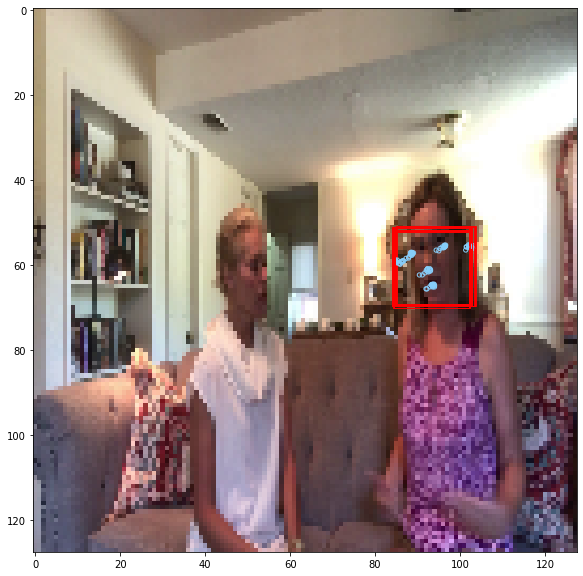

In [92]:
plot_detections(frames[0], max_detection)

In [93]:
crop_face(frames[0], max_detection)

## Prediction loop

In [94]:
def predict_on_video(video_path, batch_size):
    try:
        # Find the faces for N frames in the video.
        faces, frames = face_extractor.process_video(video_path)

        # Only look at one face per frame.
        faces = face_extractor.keep_only_best_face(faces)

        if len(faces) > 0:
            # NOTE: When running on the CPU, the batch size must be fixed
            # or else memory usage will blow up. (Bug in PyTorch?)
            x = np.zeros((batch_size, input_size, input_size, 3), dtype=np.uint8)

            # If we found any faces, prepare them for the model.
            n = 0
            for index, face in enumerate(faces):
                # Resize to the model's required input size.
                # We keep the aspect ratio intact and add zero
                # padding if necessary.     
                face = crop_face(frames[index], face)
                face = np.array(face)
                resized_face = isotropically_resize_image(face, input_size)
                resized_face = make_square_image(resized_face)

                if n < batch_size:
                    x[n] = resized_face
                    n += 1
                else:
                    print("WARNING: have %d faces but batch size is %d" % (n, batch_size))

                # Test time augmentation: horizontal flips.
                # TODO: not sure yet if this helps or not
                #x[n] = cv2.flip(resized_face, 1)
                #n += 1

            if n > 0:
                x = torch.tensor(x, device=gpu).float()

                # Preprocess the images.
                x = x.permute((0, 3, 1, 2))

                for i in range(len(x)):
                    x[i] = normalize_transform(x[i] / 255.)

                # Make a prediction, then take the average.
                with torch.no_grad():
                    y_pred = model(x)
                    y_pred = torch.sigmoid(y_pred.squeeze())
                    return y_pred[:n].mean().item()

    except Exception as e:
        print("Prediction error on video %s: %s" % (video_path, str(e)))

    return 0.5

In [95]:
predict_on_video(video_path, 27)

0.00016155156481545419

In [96]:
from concurrent.futures import ThreadPoolExecutor

def predict_on_video_set(videos, num_workers, data_dir=test_dir):
    def process_file(i):
        filename = videos[i]
        y_pred = predict_on_video(os.path.join(data_dir, filename), batch_size=frames_per_video)
        return y_pred

    with ThreadPoolExecutor(max_workers=num_workers) as ex:
        predictions = ex.map(process_file, range(len(videos)))

    return list(predictions)

# Evaluation

In [97]:
from sklearn.metrics import accuracy_score, roc_curve, auc, roc_auc_score, classification_report

In [98]:
train_dir = "./data/train_sample_videos" ## One sample of training data

metadata = pd.read_json('./data/train_sample_videos/metadata.json').T
metadata

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4
...,...,...,...
etejaapnxh.mp4,FAKE,train,wtreibcmgm.mp4
etmcruaihe.mp4,FAKE,train,afoovlsmtx.mp4
etohcvnzbj.mp4,FAKE,train,bdnaqemxmr.mp4
eudeqjhdfd.mp4,REAL,train,None


In [99]:
train_videos = list(list(metadata.index))
len(train_videos)

400

In [100]:
y_truth = list((metadata['label'] == 'FAKE').astype(np.int))
# sanity check
sum(y_truth)

323

In [ ]:
predictions = predict_on_video_set(train_videos, num_workers=5, data_dir=train_dir)

Prediction error on video ./data/train_sample_videos/abofeumbvv.mp4: cannot perform reduction function max on tensor with no elements because the operation does not have an identity
Prediction error on video ./data/train_sample_videos/aapnvogymq.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 2 and 1 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu:71
Prediction error on video ./data/train_sample_videos/acifjvzvpm.mp4: cannot perform reduction function max on tensor with no elements because the operation does not have an identity


In [ ]:
y_truth, predictions = np.array(y_truth), np.array(predictions)

In [ ]:
# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()

# Compute micro-average ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_truth, predictions)
roc_auc = auc(fpr, tpr)

In [ ]:
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [ ]:
threshold = 0.5
pred_labels = np.where(predictions < threshold, 0, 1)

In [ ]:
accuracy_score(y_truth, pred_labels)

In [ ]:
print(classification_report(y_truth, pred_labels, target_names=["FAKE", "REAL"]))

In [ ]:
# Loss:
def get_bce_loss(predictions, y_truth):
    predictions, y_truth = torch.Tensor(predictions).to(gpu).float(), torch.Tensor(y_truth).to(gpu).float()

    return F.binary_cross_entropy_with_logits(predictions, y_truth).cpu().detach().numpy()

get_bce_loss(predictions, y_truth)

## Speed test

The leaderboard submission must finish within 9 hours. With 4000 test videos, that is `9*60*60/4000 = 8.1` seconds per video. So if the average time per video is greater than ~8 seconds, the kernel will be too slow!

In [474]:
speed_test = False  # you have to enable this manually

In [475]:
if speed_test:
    start_time = time.time()
    speedtest_videos = test_videos[:5]
    predictions = predict_on_video_set(speedtest_videos, num_workers=4)
    elapsed = time.time() - start_time
    print("Elapsed %f sec. Average per video: %f sec." % (elapsed, elapsed / len(speedtest_videos)))

## Make the submission

In [486]:
predictions = predict_on_video_set(test_videos[:2], num_workers=4)

Prediction error on video ./data/test_videos/xitgdpzbxv.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 1 and 2 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu:71
Prediction error on video ./data/test_videos/aassnaulhq.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 0 and 1 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu:71


In [487]:
predictions

[0.5, 1.026132622428122e-06]

Prediction error on video ./data/test_videos/xmkwsnuzyq.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 1 and 0 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu:71
Prediction error on video ./data/test_videos/yarpxfqejd.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 0 and 1 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu:71
Prediction error on video ./data/test_videos/yaxgpxhavq.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 1 and 0 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu:71
Prediction error on video ./data/test_videos/yietrwuncf.mp4: invalid argument 0: Sizes of tensors must match except in dimension 0. Got 0 and 1 in dimension 1 at /opt/conda/conda-bld/pytorch_1579022060824/work/aten/src/THC/generic/THCTensorMath.cu

In [497]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join('./data/test_videos', video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

In [499]:
play_video(test_videos[0])

In [500]:
predictions[0]

0.5

Debugging

In [130]:
video_name = 'btxlttbpkj.mp4'

In [131]:
vid_path = f'./data/train_sample_videos/{video_name}'

In [132]:
video_name in list(metadata.index)

True

In [133]:
metadata.loc[video_name]

label                 FAKE
split                train
original    fhghkqdkhe.mp4
Name: btxlttbpkj.mp4, dtype: object

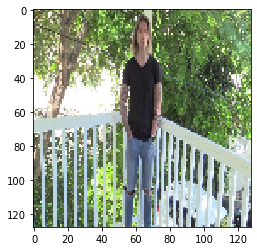

In [134]:
frame = read_frame(vid_path, size=(128, 128))
plt.imshow(frame)

CPU times: user 15 ms, sys: 0 ns, total: 15 ms
Wall time: 7.35 ms
Found 0 faces


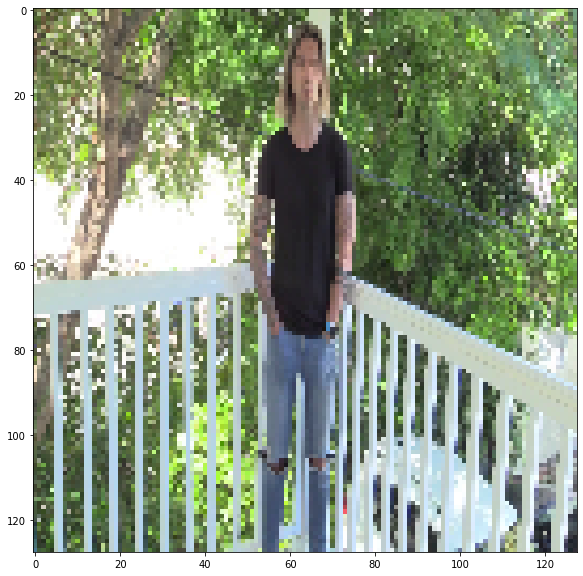

In [135]:
%time detections = face_detector.predict_on_image(frame)

plot_detections(frame, detections)

In [136]:
detections

tensor([], device='cuda:0', size=(0, 17))